In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import os
from os.path import join
import re
import math
from statsmodels.tsa.seasonal import STL

# Funções Úteis

In [9]:
def plot_grouped_data(
    df: pd.DataFrame,
    group_col: str,
    value_col: str,
    xticks_rotation: int = 0,
    apply_log: bool = False):

    """
    Plota dados agrupados do DataFrame fornecido.

    Parâmetros
    ----------
    df: pd.DataFrame
        Os dados a serem plotados.
    group_col: str
        O nome da coluna a ser agrupada.
    value_col: str
        O nome da coluna para os valores a serem plotados.
    bar: bool, opcional
        Se True, plota gráficos de barras. O padrão é False.
    x_axis: bool, opcional
        Se True, plota no eixo x. O padrão é False.
    hue_col: str, opcional
        O nome da coluna para o hue. O padrão é None.
    xticks_rotation: int, opcional
        Ângulo de rotação para x-ticks. O padrão é 0.
    apply_log: bool, opcional
        Se True, aplica transformação de log aos valores. O padrão é False.
    """


    if apply_log:
        df[value_col] = np.log(df[value_col])

    grouped_data = list(df.groupby(by=group_col))

    num_plots = len(grouped_data)
    num_cols = 2
    num_rows = math.ceil(num_plots / num_cols)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 6 * num_rows), sharey=True)
    axes = axes.reshape(-1, num_cols) if num_rows > 1 else [axes]

    for idx, (group, df_values) in enumerate(grouped_data):
        row, col = divmod(idx, num_cols)
        ax = axes[row][col]
        
        sns.lineplot(df_values[value_col], ax=ax)
        
        plt.suptitle(value_col)
        ax.set_title(group)
        plt.xticks(rotation=xticks_rotation)

    for idx in range(num_plots, num_rows * num_cols):
        row, col = divmod(idx, num_cols)
        fig.delaxes(axes[row][col])

    plt.tight_layout()
    plt.show()

In [41]:
def plot_decomposition(
    observed_values: pd.Series,
    seasonal_values: pd.Series,
    trend_values: pd.Series,
    residual_values: pd.Series,
    title: str):

    # Define o tamanho da figura
    plt.figure(figsize=(10, 8))
    plt.suptitle(title)

    # Gráfico dos valores originais
    plt.subplot(4, 1, 1)
    plt.plot(observed_values, label='Valores Reais', color='black')
    plt.title('Valores Reais')
    plt.grid(True)
    plt.legend()

    # Gráfico da tendência
    plt.subplot(4, 1, 2)
    plt.plot(seasonal_values, label='Sazonalidade', color='blue')
    plt.title('Sazonalidade')
    plt.grid(True)
    plt.legend()

    # Gráfico da sazonalidade
    plt.subplot(4, 1, 3)
    plt.plot(trend_values, label='Tendência', color='green')
    plt.title('Tendência')
    plt.grid(True)
    plt.legend()

    # Gráfico do resíduo
    plt.subplot(4, 1, 4)
    plt.plot(residual_values, label='Resíduos', color='red')
    plt.title('Resíduos')
    plt.grid(True)
    plt.legend()

    # Ajusta o layout para evitar sobreposição
    plt.tight_layout()
    plt.show()

In [42]:
def plot_decomposition_per_year(
    observed_values_by_year: dict,
    seasonal_values_by_year: dict,
    trend_values_by_year: dict,
    residual_values_by_year: dict,
    title: str):
    """
    Plota a decomposição temporal com subplots para cada ano.
    Cada ano terá uma linha com gráficos de valores reais, sazonalidade, tendência e resíduos.
    """
    # Número de anos para definir subplots
    n_years = len(observed_values_by_year)

    # Define o tamanho da figura dinamicamente
    fig, axes = plt.subplots(n_years, 4, figsize=(20, 4 * n_years), sharex=False)
    fig.suptitle(title, fontsize=16)

    # Garante que axes seja sempre uma matriz, mesmo com um único ano
    if n_years == 1:
        axes = axes.reshape(1, 4)

    # Itera sobre cada ano e seus respectivos dados
    for i, (year, observed_values) in enumerate(observed_values_by_year.items()):
        # Obtém os valores correspondentes para o ano
        seasonal_values = seasonal_values_by_year[year]
        trend_values = trend_values_by_year[year]
        residual_values = residual_values_by_year[year]

        # Subplot 1: Valores Reais
        axes[i, 0].plot(observed_values, label='Valores Reais', color='black')
        axes[i, 0].set_title(f"Ano {year} - Valores Reais")
        axes[i, 0].grid(True)
        axes[i, 0].legend()

        # Subplot 2: Sazonalidade
        axes[i, 1].plot(seasonal_values, label='Sazonalidade', color='blue')
        axes[i, 1].set_title(f"Ano {year} - Sazonalidade")
        axes[i, 1].grid(True)
        axes[i, 1].legend()

        # Subplot 3: Tendência
        axes[i, 2].plot(trend_values, label='Tendência', color='green')
        axes[i, 2].set_title(f"Ano {year} - Tendência")
        axes[i, 2].grid(True)
        axes[i, 2].legend()

        # Subplot 4: Resíduos
        axes[i, 3].plot(residual_values, label='Resíduos', color='red')
        axes[i, 3].set_title(f"Ano {year} - Resíduos")
        axes[i, 3].grid(True)
        axes[i, 3].legend()

    # Ajusta o layout para evitar sobreposição
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Espaço para o título principal
    plt.show()


# Coleta de Dados

In [2]:
MODULE_PATH = Path().absolute().parent
DATA_PATH = join(MODULE_PATH, "sources/processed")

In [70]:
processed_data = pd.read_csv(join(DATA_PATH, "processed_data.csv"))

# Pré-processamento

In [71]:
processed_data["Datetime"] = pd.to_datetime(processed_data["Datetime"])
processed_data["Ano"] = processed_data["Ano"].astype(str)

In [72]:
processed_data["Data"] = list(processed_data["Datetime"].dt.date)

# Agregação Diária

In [73]:
feature_columns = processed_data.columns[1:-2]

In [86]:
daily_data = processed_data.groupby("Data")[processed_data.columns[1:-2]].mean()
daily_data["Ano"] = list(pd.to_datetime(daily_data.reset_index()["Data"]).dt.year)

## Decomposição Temporal

### Por Ano

In [95]:
decomposition_df_by_year_list = []
for group, df_values in daily_data.groupby("Ano"):

    df_list = []
    for feature in feature_columns:
        feature_values = df_values[feature].ffill().bfill()
        decomposition = STL(feature_values, period=7).fit()

        feature_decomposition_df = pd.DataFrame()
        feature_decomposition_df["Data"] = feature_values.index
        feature_decomposition_df["Parametro"] = feature
        feature_decomposition_df["Tendencia"] = decomposition.trend.values
        feature_decomposition_df["Sazonalidade"] = decomposition.seasonal.values
        feature_decomposition_df["Residuo"] = decomposition.resid.values
        feature_decomposition_df["Ano"] = str(group)
    
        df_list.append(feature_decomposition_df)
    
    feature_decomposition_df = pd.concat(df_list)
    decomposition_df_by_year_list.append(feature_decomposition_df)

decomposition_df_by_year = pd.concat(decomposition_df_by_year_list)

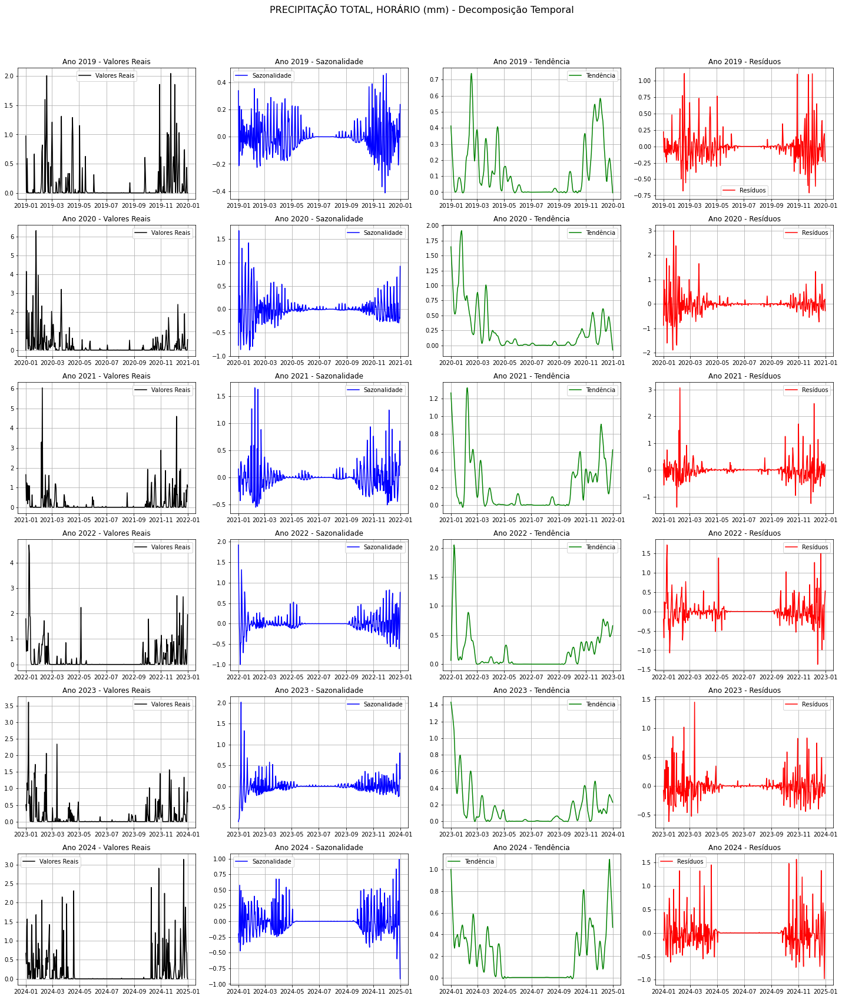

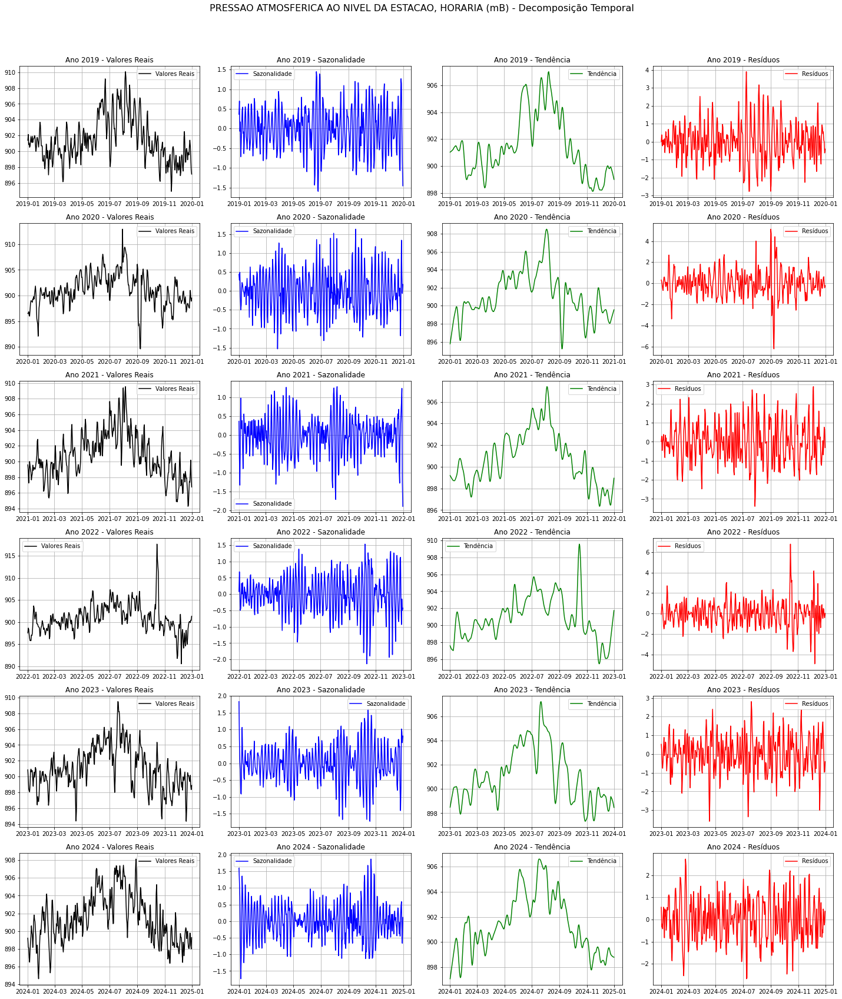

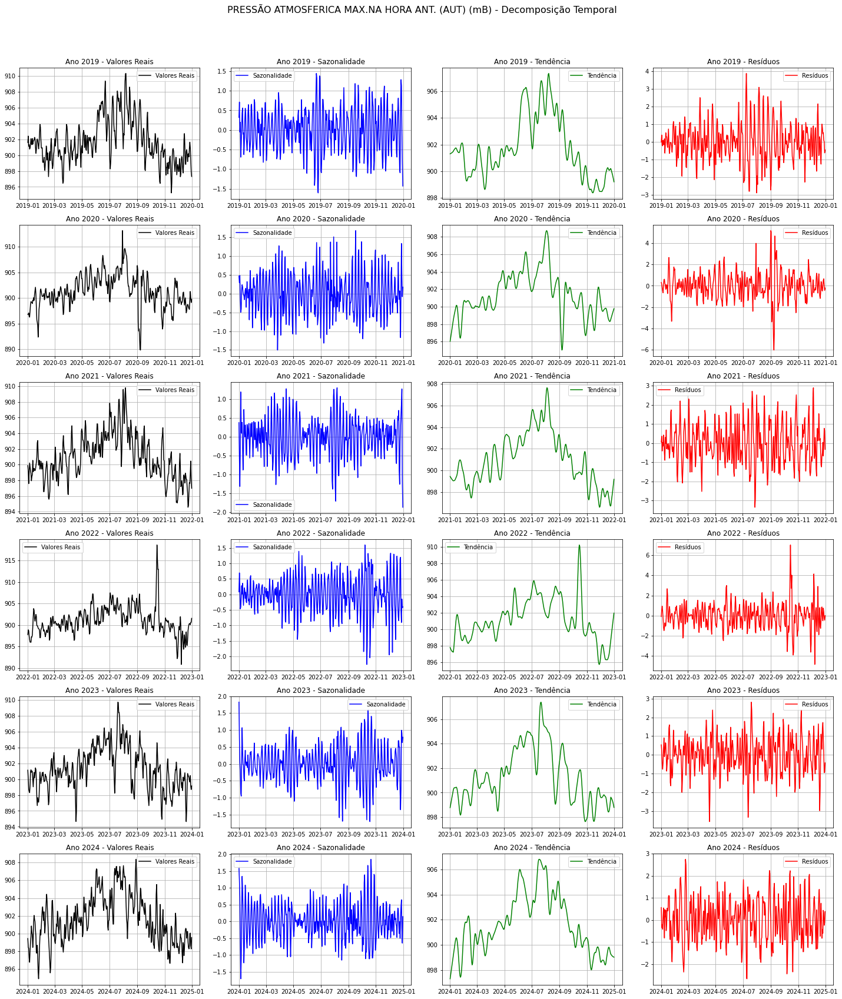

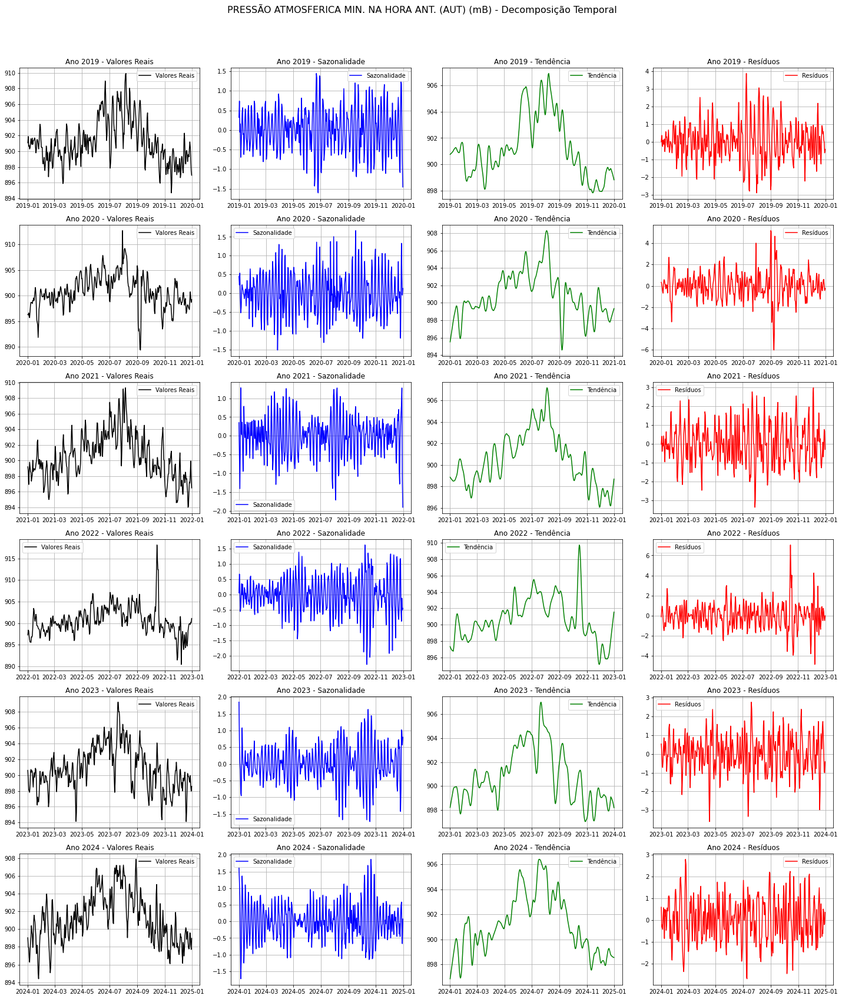

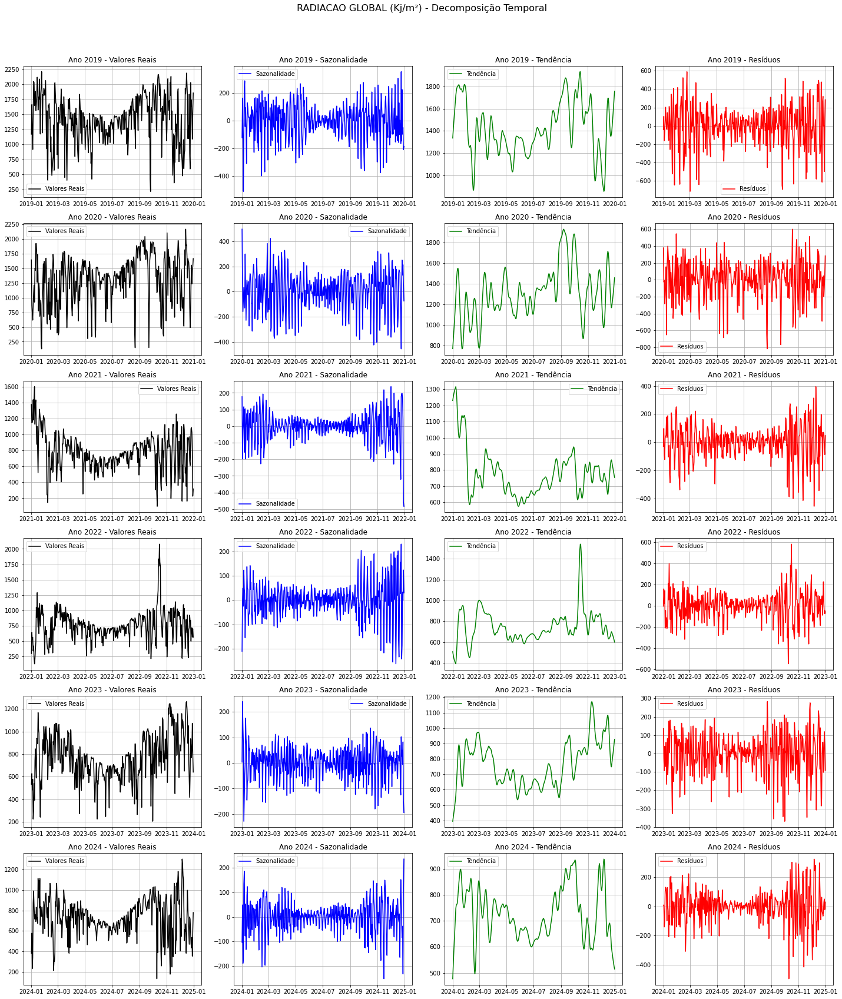

...

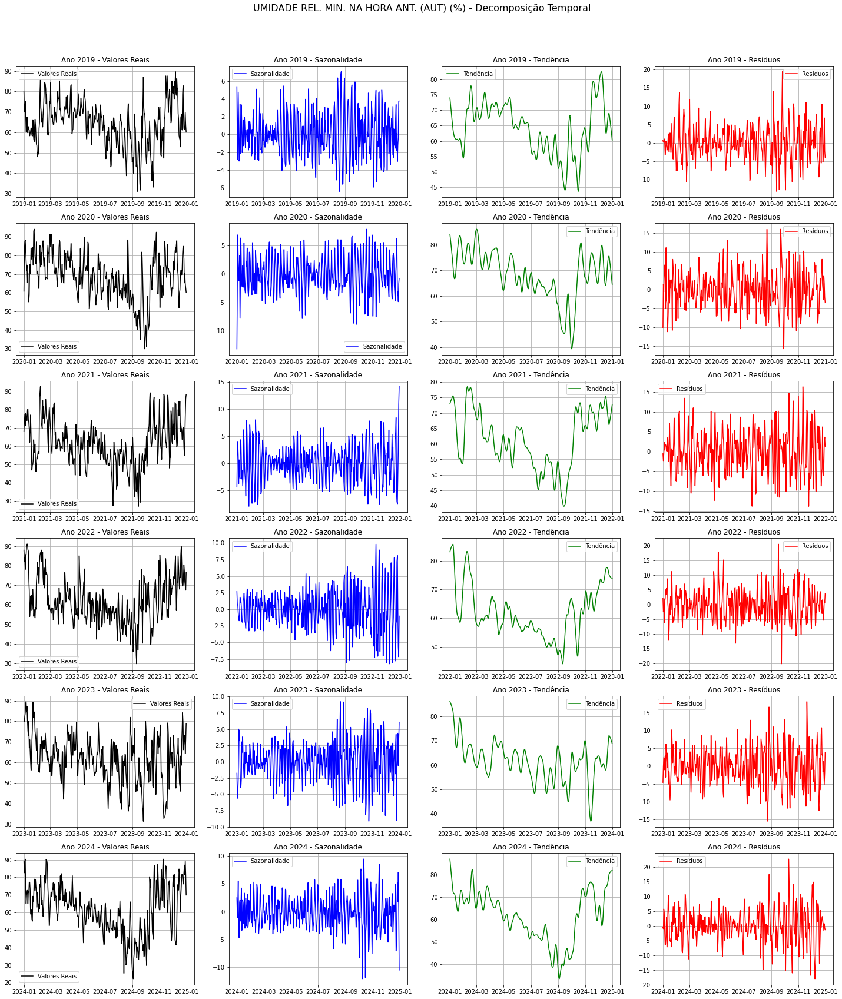

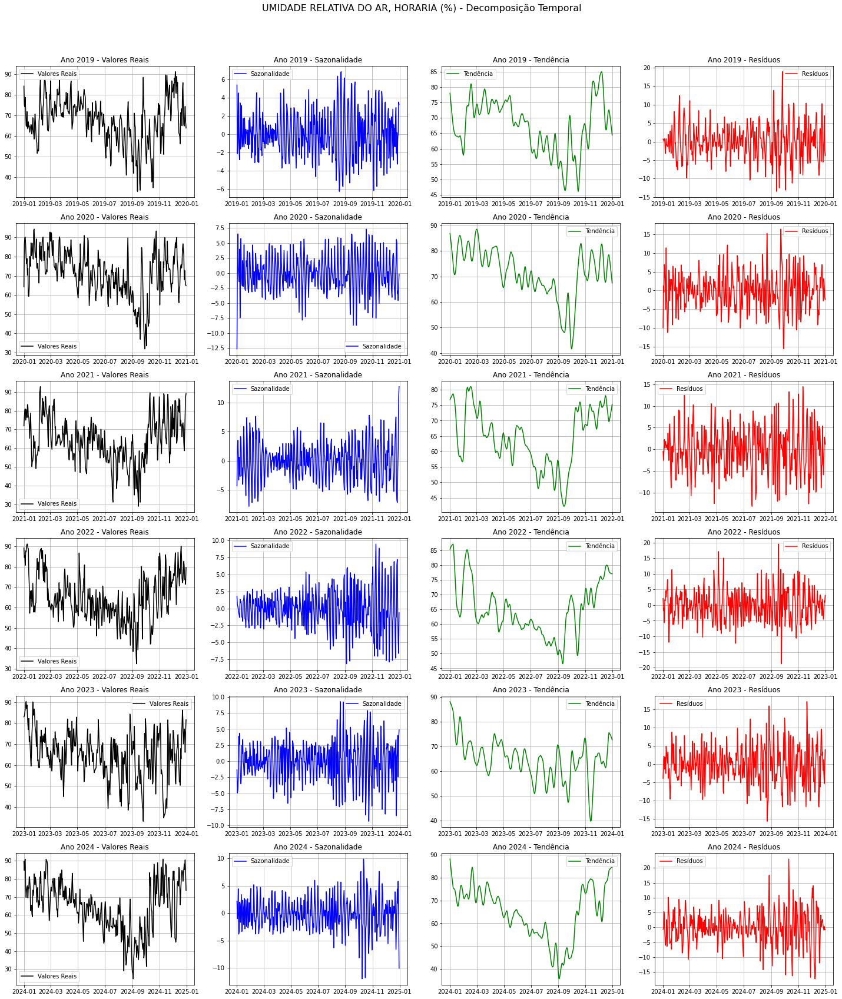

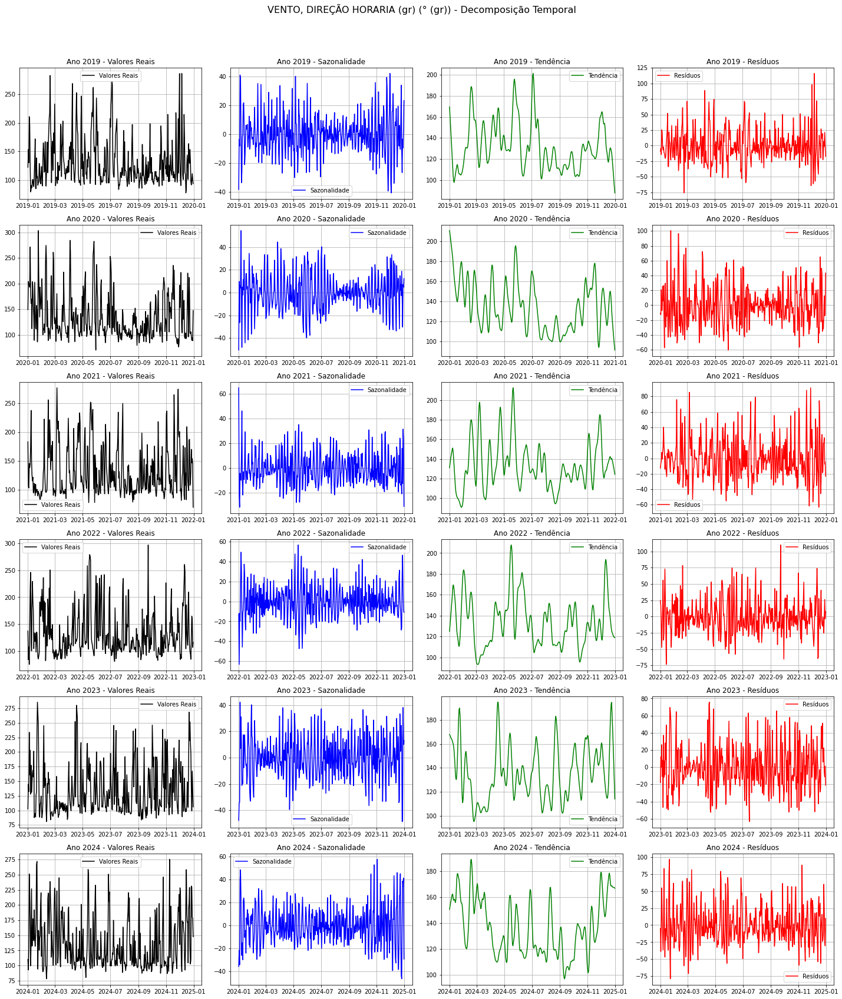

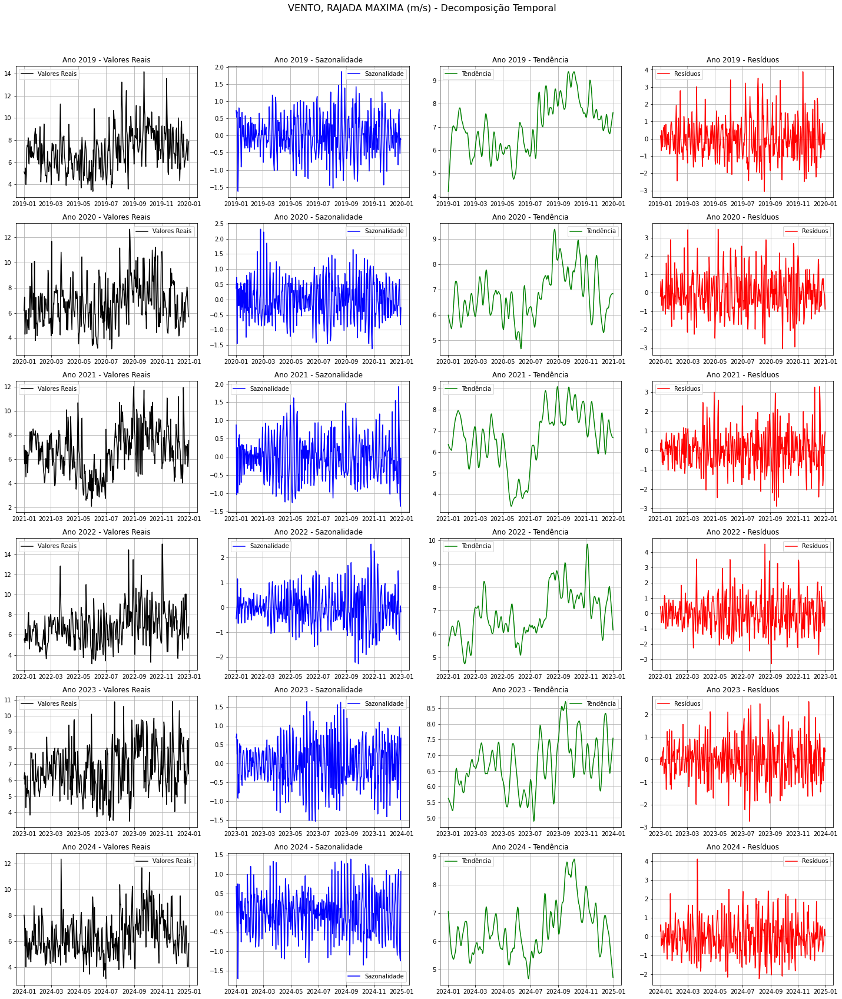

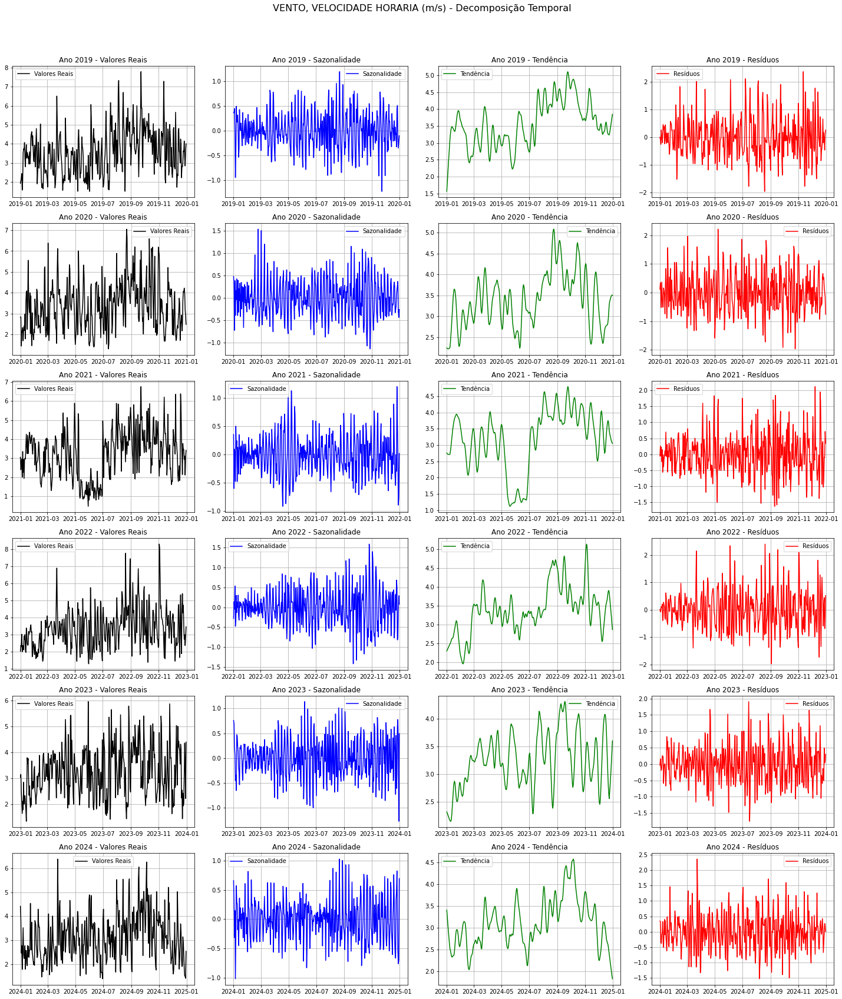

In [98]:
for feature in feature_columns:
    feature_decomposition_df = decomposition_df_by_year[decomposition_df_by_year["Parametro"] == feature]
    feature_decomposition_df.set_index("Data", inplace=True)

    # Dicionários para armazenar os dados por ano
    observed_values_by_year = {}
    seasonal_values_by_year = {}
    trend_values_by_year = {}
    residual_values_by_year = {}

    for group, df_values in feature_decomposition_df.groupby("Ano"):
        # Observados para o ano atual
        observed_data = daily_data[daily_data["Ano"].astype(str) == group][feature]

        # Adiciona os dados aos dicionários
        observed_values_by_year[group] = observed_data
        seasonal_values_by_year[group] = df_values["Sazonalidade"]
        trend_values_by_year[group] = df_values["Tendencia"]
        residual_values_by_year[group] = df_values["Residuo"]

    # Chamada da função para plotar os subplots por ano
    plot_decomposition_per_year(
        observed_values_by_year=observed_values_by_year,
        seasonal_values_by_year=seasonal_values_by_year,
        trend_values_by_year=trend_values_by_year,
        residual_values_by_year=residual_values_by_year,
        title=f"{feature} - Decomposição Temporal"
    )
